In [1]:
from albumentations import (
    HorizontalFlip, IAAPerspective, ShiftScaleRotate, CLAHE, RandomRotate90,
    Transpose, ShiftScaleRotate, Blur, OpticalDistortion, GridDistortion, HueSaturationValue,
    IAAAdditiveGaussianNoise, GaussNoise, MotionBlur, MedianBlur, IAAPiecewiseAffine,
    IAASharpen, IAAEmboss, RandomBrightnessContrast, Flip, OneOf, Compose
)
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt
#import matplotlib as plt
%matplotlib inline
IMG_SIZE = 500
train_set = []
imagePath = '/home/brett/BigData/trainSet/Impressionism/'

In [2]:
i = 5  #equal to the number of pictures we want to augment and view
for img in os.listdir(imagePath):
	if i > 0:
		img_array = cv2.imread(os.path.join(imagePath, img))
		new_mat = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))

		train_set.append(new_mat)
		i-=1


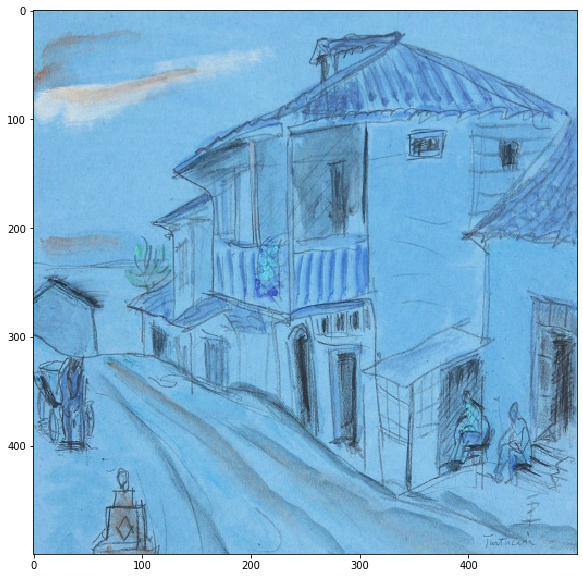

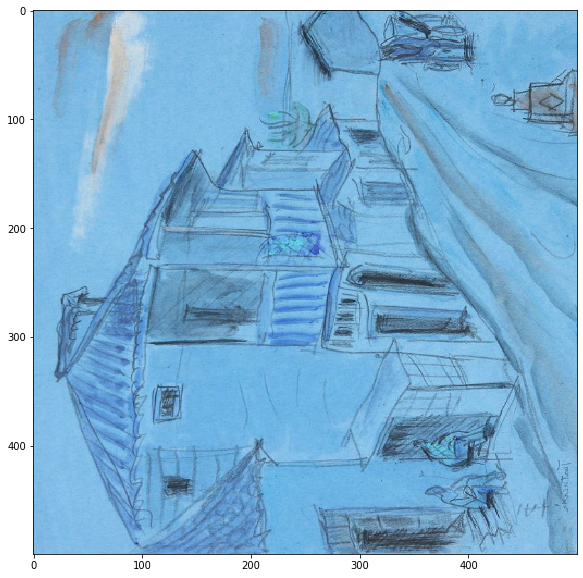

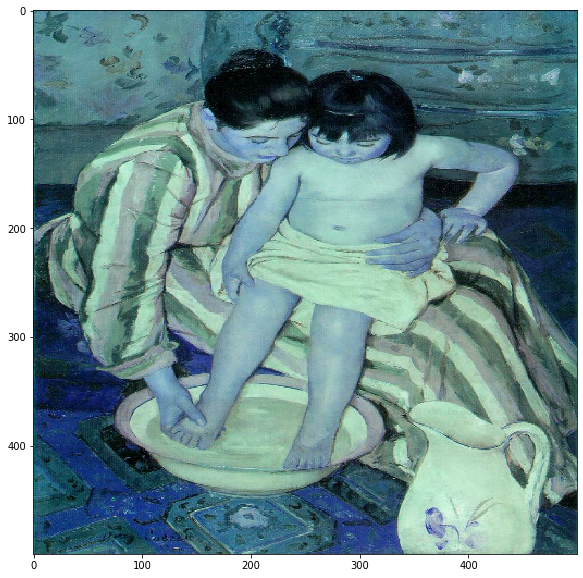

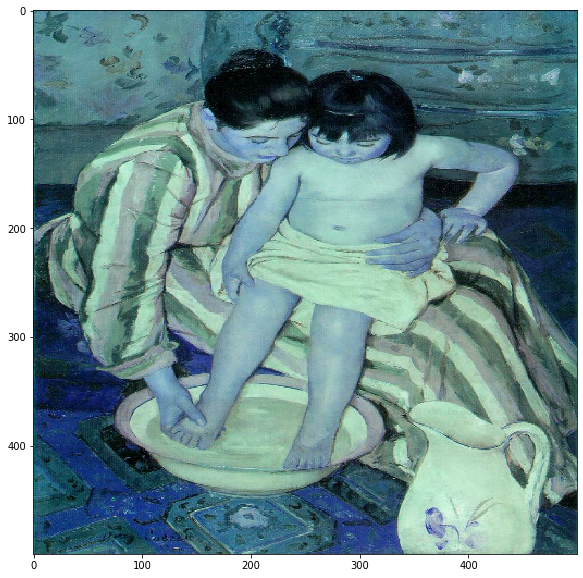

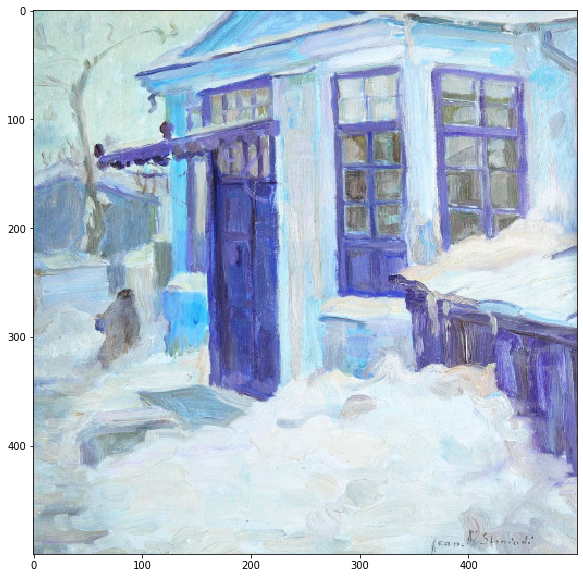

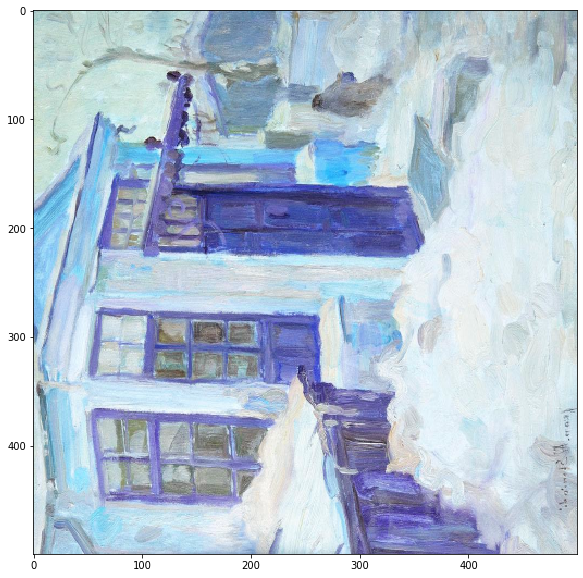

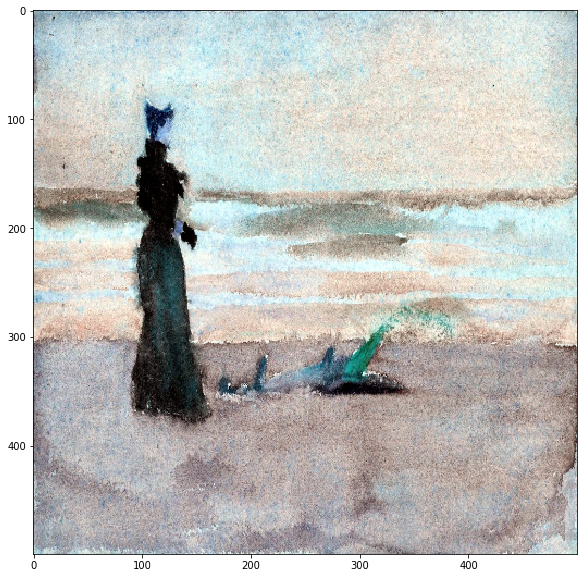

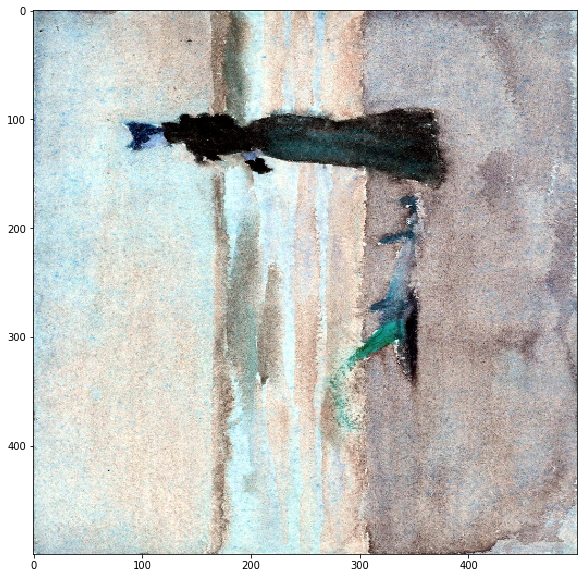

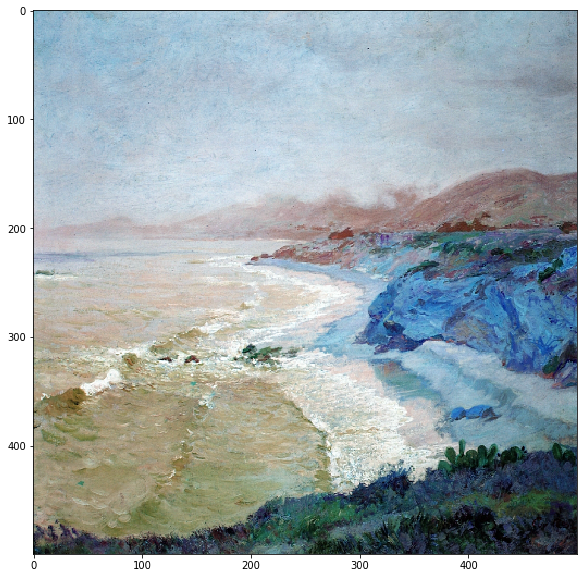

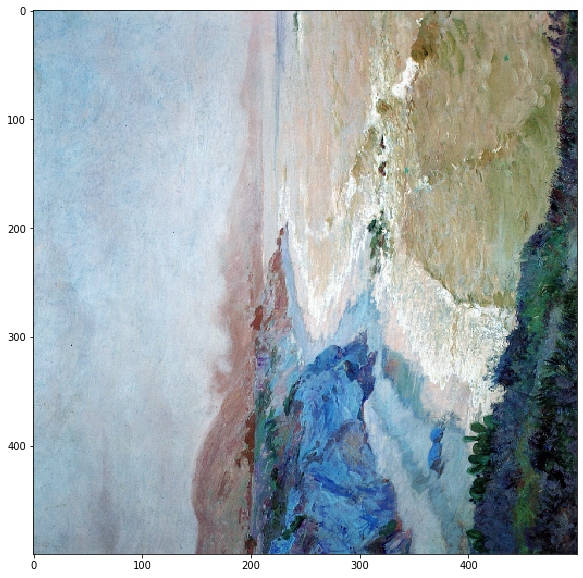

In [7]:
#from documentation
def augment_and_show(aug, image):
    image = aug(image=image)['image']
    plt.figure(figsize=(10, 10))
    plt.imshow(image)

for img in train_set:
    plt.figure(figsize=(10,10))
    plt.imshow(img)
    #augmentation = GaussNoise()
    augmentation = Transpose()
    #we can try all of the augmentations, and apply multiple at once
    augment_and_show(augmentation, img)




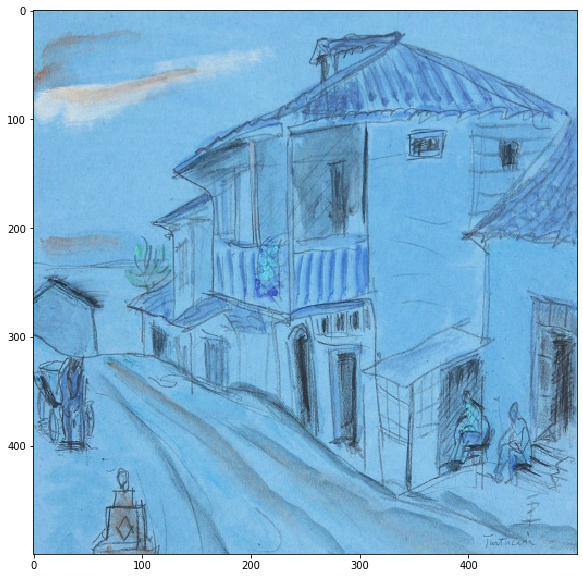

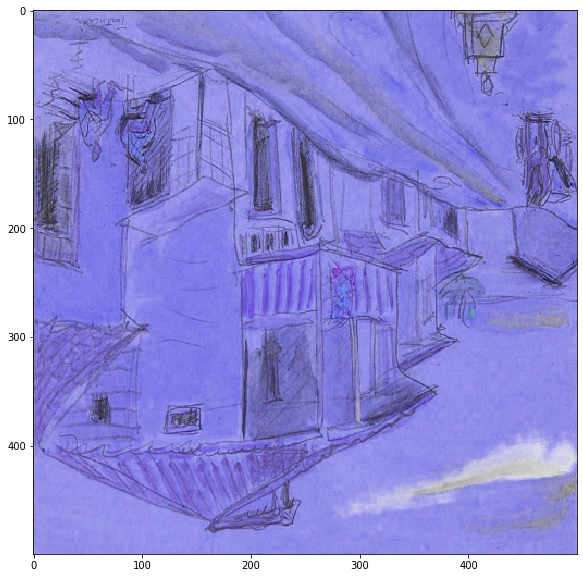

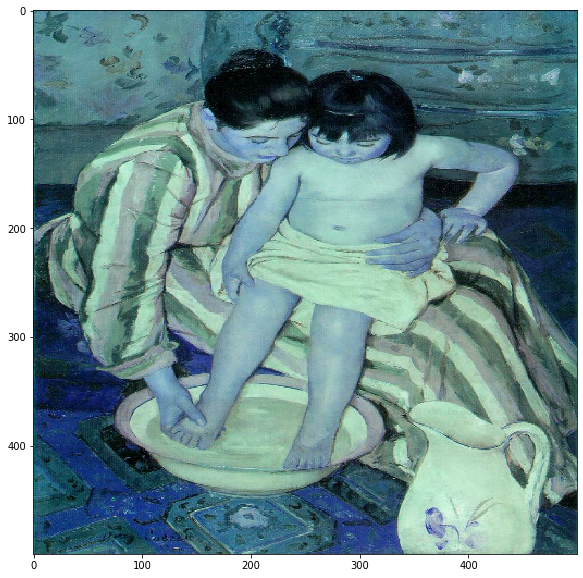

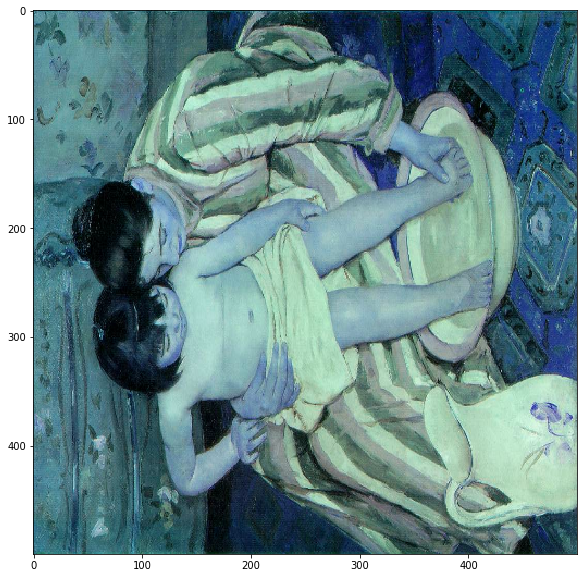

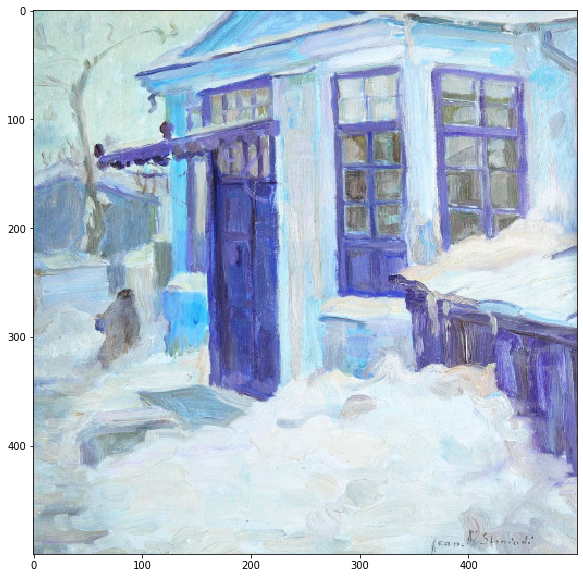

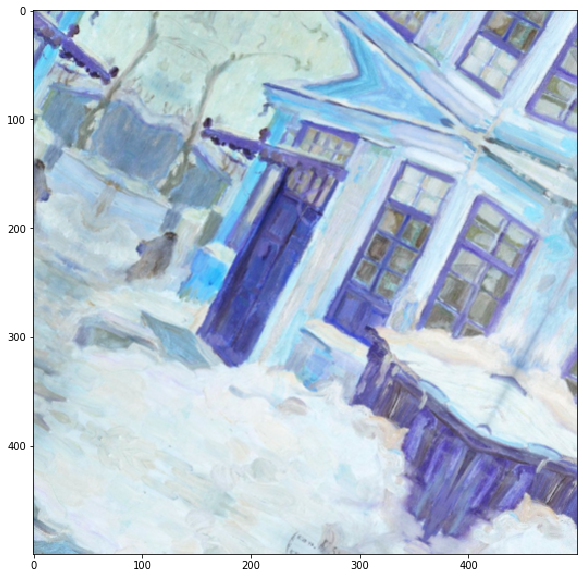

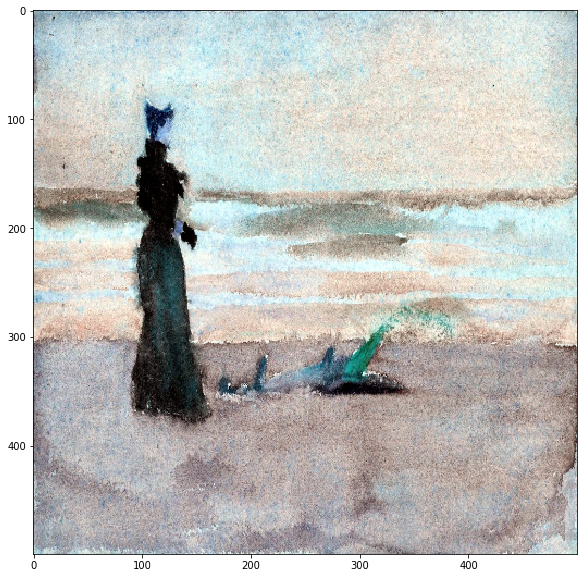

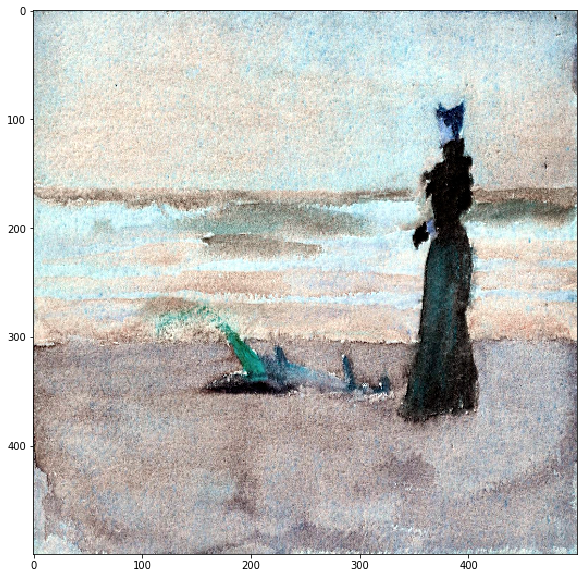

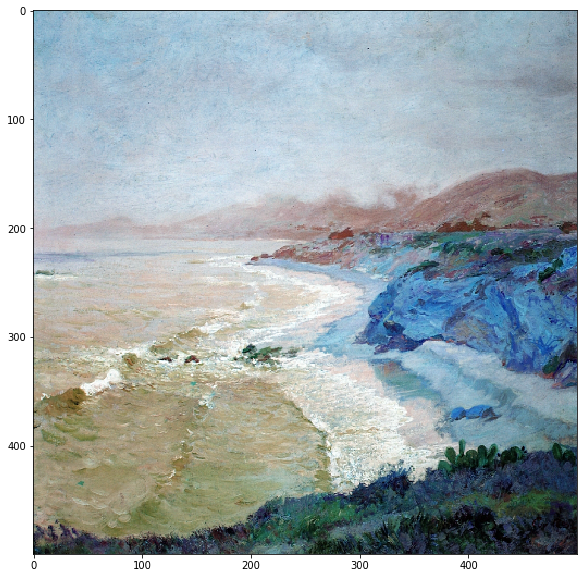

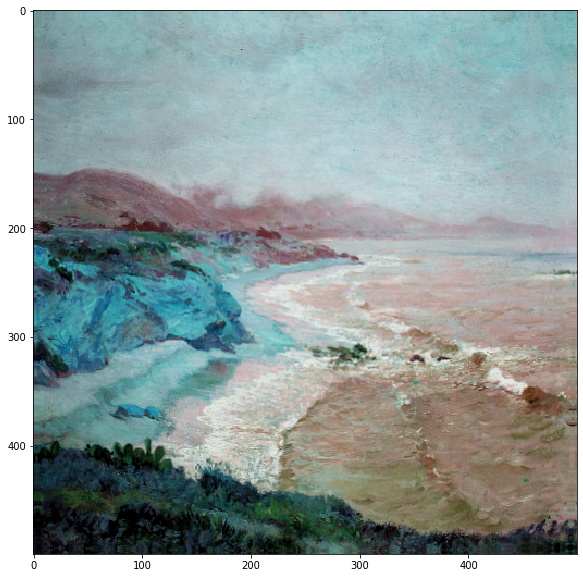

In [8]:
#documentation function



def augment_flips_color(p=.5):
    return Compose([
        CLAHE(),
        RandomRotate90(),
        Transpose(),
        ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.50, rotate_limit=45, p=.75),
        Blur(blur_limit=3),
        OpticalDistortion(),
        GridDistortion(),
        HueSaturationValue()
    ], p=p)

def strong_aug(p=.5):
    return Compose([
        RandomRotate90(),
        Flip(),
        Transpose(),
        OneOf([
            IAAAdditiveGaussianNoise(),
            GaussNoise(),
        ], p=0.2),
        OneOf([
            MotionBlur(p=.2),
            MedianBlur(blur_limit=3, p=0.1),
            Blur(blur_limit=3, p=0.1),
        ], p=0.2),
        ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2, rotate_limit=45, p=0.2),
        OneOf([
            OpticalDistortion(p=0.3),
            GridDistortion(p=.1),
            IAAPiecewiseAffine(p=0.3),
        ], p=0.2),
        OneOf([
            CLAHE(clip_limit=2),
            IAASharpen(),
            IAAEmboss(),
            RandomBrightnessContrast(),            
        ], p=0.3),
        HueSaturationValue(p=0.3),
    ], p=p)


for img in train_set:
	plt.figure(figsize=(10,10))
	plt.imshow(img)
	augmentation = strong_aug(p=1)
	augment_and_show(augmentation, img)
